# **Proyek Klasifikasi Gambar: Mask Detection**
- **Nama:** Laetisha Haryanto
- **Email:** laetishaharyanto@gmail.com
- **ID Dicoding:** MC006D5X2407

Dataset diakses dari: https://data.mendeley.com/datasets/8pn3hg99t4/2

## **Import Semua Packages/Library yang Digunakan**

In [2]:
# Mengimpor libraries umum yang sering digunakan
import os, shutil
import zipfile
import random
from random import sample
import shutil
from shutil import copyfile
import pathlib
from pathlib import Path
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm as tq

# Libraries untuk visualisasi
%matplotlib inline
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.image import imread

# Libraries untuk pemrosesan data gambar
import cv2
from PIL import Image
import skimage
from skimage import io
from skimage.transform import resize
from skimage.transform import rotate, AffineTransform, warp
from skimage import img_as_ubyte
from skimage.exposure import adjust_gamma
from skimage.util import random_noise

# Libraries untuk pembuatan dan evaluasi model
import keras
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
import tensorflow as tf
from tensorflow.keras import Model, layers
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
from tensorflow.keras.layers import InputLayer, Conv2D, SeparableConv2D, MaxPooling2D, MaxPool2D, Dense, Flatten, Dropout, BatchNormalization
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.applications.densenet import DenseNet121
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import ModelCheckpoint, Callback, EarlyStopping, ReduceLROnPlateau

# Mengabaikan peringatan
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

### **Data Preparation**

### **Data Loading**

In [50]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
# Path ke file ZIP kamu
zip_path = '/content/drive/MyDrive/proyek klasifikasi gambar/dataset.zip'

# Lokasi tujuan ekstrak di Colab
extract_to = '/content/dataset'

# Ekstrak
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

In [5]:
for root, dirs, files in os.walk(extract_to):
    level = root.replace(extract_to, '').count(os.sep)
    indent = ' ' * 4 * level
    print(f"{indent}{os.path.basename(root)}/")
    subindent = ' ' * 4 * (level + 1)
    for f in files[:3]:
        print(f"{subindent}{f}")

dataset/
    NewFace Mask Dataset/
        Incorrect/
            N95/
                Male/
                    FM 20999.jpg
                    FM 21325.jpg
                    FM 20619.jpg
                Female/
                    FM 20047.jpg
                    FM 20400.jpg
                    FM 19976.jpg
                Child/
                    FM 18379.jpg
                    FM 18872.jpg
                    FM 18747.jpg
            Surgical/
                Male/
                    FM 24746.jpg
                    FM 24607.jpg
                    FM 24196.jpg
                Female/
                    FM 23197.jpg
                    FM 23128.jpg
                    FM 23243.jpg
                Child/
                    FM 22187.jpg
                    FM 21746.jpg
                    FM 22304.jpg
            Cotton/
                Male/
                    FM 17930.jpg
                    FM 17939.jpg
                    FM 18165.jpg
                Female/
          

### **Data Preprocessing**

In [6]:
# Dictionary untuk menyimpan file gambar per kelas
mask_image = {}

base_dir = "/content/dataset/NewFace Mask Dataset"

# Looping semua folder di bawah base_dir
for label in os.listdir(base_dir):
    label_path = os.path.join(base_dir, label)
    if os.path.isdir(label_path):
        for mask_type in os.listdir(label_path):
            mask_type_path = os.path.join(label_path, mask_type)
            for person_type in os.listdir(mask_type_path):
                person_path = os.path.join(mask_type_path, person_type)
                if os.path.isdir(person_path):
                    key = f"{label}_{mask_type}_{person_type}"
                    mask_image[key] = [os.path.join(person_path, img) for img in os.listdir(person_path)
                                       if img.lower().endswith(('.jpg', '.jpeg', '.png'))]

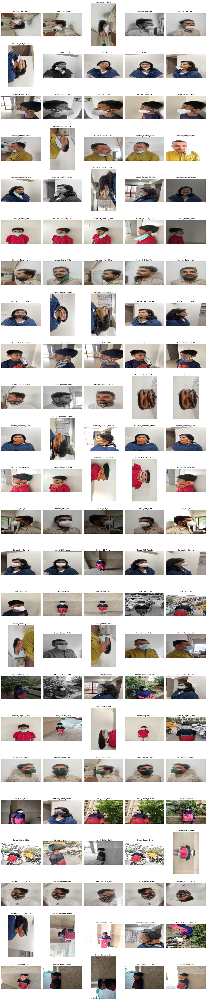

In [7]:
rows = len(mask_image)
cols = 5
fig, axs = plt.subplots(rows, cols, figsize=(15, 3 * rows))

for i, (class_key, images) in enumerate(mask_image.items()):
    chosen_images = np.random.choice(images, size=min(5, len(images)), replace=False)
    for j, img_path in enumerate(chosen_images):
        img = Image.open(img_path).convert("RGB")
        axs[i, j].imshow(img)
        axs[i, j].set_title(class_key, fontsize=8)
        axs[i, j].axis("off")

fig.tight_layout()
plt.show()

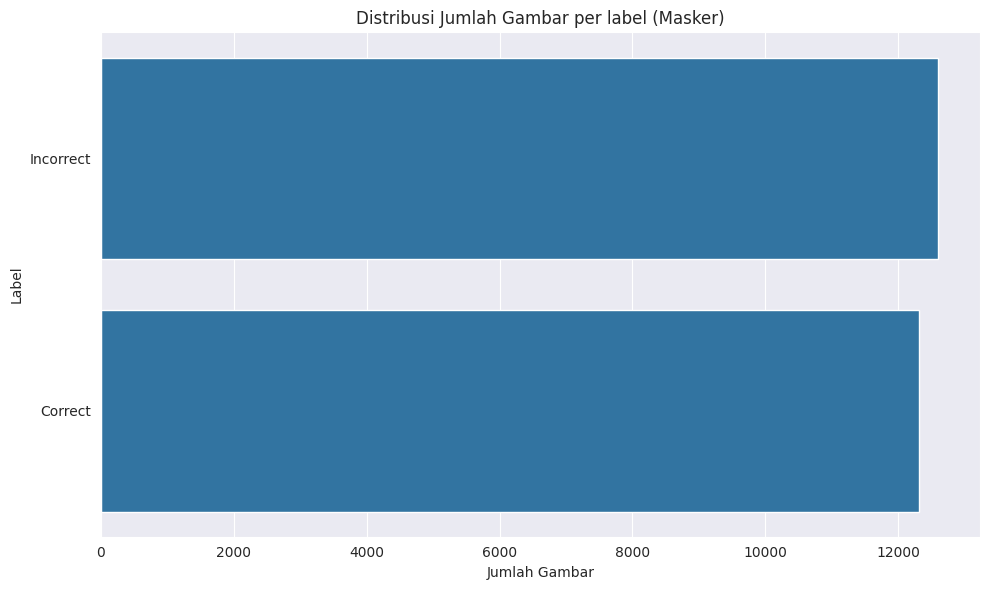

In [8]:
# Define path ke dataset kamu
mask_path = "/content/dataset/NewFace Mask Dataset"

# List untuk simpan info file
file_name = []
labels = []
full_path = []

# Looping ambil semua file dari subfolder
for path, subdirs, files in os.walk(mask_path):
    for name in files:
        if name.lower().endswith(('.jpg', '.jpeg', '.png')):
            full_path.append(os.path.join(path, name))
            labels.append(path.split('/')[-3])
            file_name.append(name)

# Buat dataframe
df = pd.DataFrame({
    "path": full_path,
    "file_name": file_name,
    "labels": labels
})

# Plot distribusi
plt.figure(figsize=(10,6))
sns.set_style("darkgrid")
sns.countplot(data=df, y='labels', order=df['labels'].value_counts().index)
plt.title("Distribusi Jumlah Gambar per label (Masker)")
plt.xlabel("Jumlah Gambar")
plt.ylabel("Label")
plt.tight_layout()
plt.show()

#### **Split Dataset**

In [9]:
# Variabel untuk path (X) dan labels (y)
X = df['path']
y = df['labels']

# Pertama, membagi dataset menjadi data train (80%) dan data temp (20%)
X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, test_size=0.2, random_state=300)

# Kedua, membagi data temp menjadi data validation (50% dari temp) dan data test (50% dari temp)
X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.5, random_state=300)

# Menyatukan data train, validation, dan test ke dalam DataFrame
df_tr = pd.DataFrame({'path': X_train, 'labels': y_train, 'set': 'train'})
df_val = pd.DataFrame({'path': X_val, 'labels': y_val, 'set': 'validation'})
df_te = pd.DataFrame({'path': X_test, 'labels': y_test, 'set': 'test'})

# Menampilkan size data train, validation, dan test
print('train size', len(df_tr))
print('validation size', len(df_val))
print('test size', len(df_te))

train size 19931
validation size 2491
test size 2492


In [10]:
# Menggabungkan DataFrame train, validation, dan test
df_all = pd.concat([df_tr, df_val, df_te], ignore_index=True)

# Menampilkan distribusi data berdasarkan set (train/validation/test) dan label
print('===================================================== \n')
print(df_all.groupby(['set', 'labels']).size(), '\n')
print('===================================================== \n')

# Cek sample data
print(df_all.sample(5))


set         labels   
test        Correct       1269
            Incorrect     1223
train       Correct       9813
            Incorrect    10118
validation  Correct       1232
            Incorrect     1259
dtype: int64 


                                                    path     labels  \
20810  /content/dataset/NewFace Mask Dataset/Correct/...    Correct   
6644   /content/dataset/NewFace Mask Dataset/Incorrec...  Incorrect   
17524  /content/dataset/NewFace Mask Dataset/Incorrec...  Incorrect   
16379  /content/dataset/NewFace Mask Dataset/Incorrec...  Incorrect   
9370   /content/dataset/NewFace Mask Dataset/Incorrec...  Incorrect   

              set  
20810  validation  
6644        train  
17524       train  
16379       train  
9370        train  


In [11]:
# Menentukan path ke dataset sumber dan tujuan
source_path = "/content/dataset/NewFace Mask Dataset"
dataset_path = "dataset-final/"

In [12]:
for index, row in tq(df_all.iterrows(), total=len(df_all)):
    file_path = row['path']

    # Cek apakah file_path valid
    if not os.path.exists(file_path):
        print(f"[WARNING] File not found: {file_path}")
        continue

    # Buat folder tujuan jika belum ada
    dest_dir = os.path.join(dataset_path, row['set'], row['labels'])
    os.makedirs(dest_dir, exist_ok=True)

    # Salin file ke folder tujuan
    destination_file_name = os.path.basename(file_path)
    file_dest = os.path.join(dest_dir, destination_file_name)

    if not os.path.exists(file_dest):
        shutil.copy2(file_path, file_dest)

  0%|          | 0/24914 [00:00<?, ?it/s]

In [13]:
# Define train, validation, and test directories
dataset_path = "dataset-final/"
TRAIN_DIR = os.path.join(dataset_path, "train")
VAL_DIR = os.path.join(dataset_path, "validation")
TEST_DIR = os.path.join(dataset_path, "test")

# Define class subdirectories
CLASSES = ['Correct', 'Incorrect']

# Menampilkan jumlah gambar untuk masing-masing kelas di setiap set
for class_label in CLASSES:
    train_path = os.path.join(TRAIN_DIR, class_label)
    val_path = os.path.join(VAL_DIR, class_label)
    test_path = os.path.join(TEST_DIR, class_label)

    # Pastikan foldernya ada, lalu hitung isinya
    train_count = len(os.listdir(train_path)) if os.path.exists(train_path) else 0
    val_count = len(os.listdir(val_path)) if os.path.exists(val_path) else 0
    test_count = len(os.listdir(test_path)) if os.path.exists(test_path) else 0

    print(f"Total {class_label} images in training set: {train_count}")
    print(f"Total {class_label} images in validation set: {val_count}")
    print(f"Total {class_label} images in test set: {test_count}")
    print("----------------------------------------------------------")

Total Correct images in training set: 9793
Total Correct images in validation set: 1232
Total Correct images in test set: 1269
----------------------------------------------------------
Total Incorrect images in training set: 10118
Total Incorrect images in validation set: 1259
Total Incorrect images in test set: 1223
----------------------------------------------------------


In [14]:
# Normalisasi (rescale) semua gambar
train_datagen = ImageDataGenerator(rescale=1./255)
val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Train generator
train_generator = train_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size=(150, 150),
    color_mode="grayscale",
    batch_size=32,
    class_mode='binary',
    shuffle=True
)

# Validation generator
validation_generator = val_datagen.flow_from_directory(
    VAL_DIR,
    target_size=(150, 150),
    color_mode="grayscale",
    batch_size=32,
    class_mode='binary',
    shuffle=False
)

# Test generator
test_generator = test_datagen.flow_from_directory(
    TEST_DIR,
    target_size=(150, 150),
    color_mode="grayscale",
    batch_size=1,
    class_mode='binary',
    shuffle=False
)

Found 19911 images belonging to 2 classes.
Found 2491 images belonging to 2 classes.
Found 2492 images belonging to 2 classes.


## **Modelling**

In [15]:
# ================== Model architecture ===================
model_1 = Sequential()

# 1st Conv Block
model_1.add(Conv2D(32, (3, 3), padding='same', activation='relu', input_shape=(150,150,1)))
model_1.add(BatchNormalization())
model_1.add(MaxPool2D((2, 2)))

# 2nd Conv Block
model_1.add(Conv2D(32, (4, 4), padding='same', activation='relu'))
model_1.add(BatchNormalization())
model_1.add(MaxPool2D((2, 2)))

# 3rd Conv Block
model_1.add(Conv2D(32, (7, 7), padding='same', activation='relu'))
model_1.add(BatchNormalization())
model_1.add(MaxPool2D((2, 2)))

# Fully connected layers
model_1.add(Flatten())
model_1.add(Dense(128, activation='relu'))
model_1.add(Dropout(0.5))
model_1.add(Dense(64, activation='relu'))
model_1.add(Dropout(0.3))
model_1.add(Dense(1, activation='sigmoid'))

# Compile model
model_1.compile(optimizer=tf.keras.optimizers.RMSprop(),
                loss='binary_crossentropy',
                metrics=['accuracy'])

# Print summary
model_1.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 150, 150, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 150, 150, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 75, 75, 32)     │        16,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 75, 75, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 37, 37, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 37, 37, 32)     │        50,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 37, 37, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 18, 18, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 10368)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     1,327,232 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,402,881 (5.35 MB)

 Trainable params: 1,402,689 (5.35 MB)

 Non-trainable params: 192 (768.00 B)

In [16]:
# ================== Callbacks ===================
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1)
checkpoint = ModelCheckpoint('model_best.h5', monitor='val_loss', save_best_only=True, verbose=1)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6, verbose=1)

# ================== Train ===================
history = model_1.fit(
    train_generator,
    epochs=30,
    validation_data=validation_generator,
    callbacks=[early_stop, checkpoint, reduce_lr]
)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
623/623 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7315 - loss: 0.8783
Epoch 1: val_loss improved from inf to 1.55259, saving model to model_best.h5


623/623 ━━━━━━━━━━━━━━━━━━━━ 1574s 3s/step - accuracy: 0.7316 - loss: 0.8777 - val_accuracy: 0.7254 - val_loss: 1.5526 - learning_rate: 0.0010
Epoch 2/30
623/623 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9261 - loss: 0.1977
Epoch 2: val_loss did not improve from 1.55259
623/623 ━━━━━━━━━━━━━━━━━━━━ 1568s 3s/step - accuracy: 0.9261 - loss: 0.1977 - val_accuracy: 0.8113 - val_loss: 2.3012 - learning_rate: 0.0010
Epoch 3/30
623/623 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9723 - loss: 0.0874
Epoch 3: val_loss improved from 1.55259 to 0.03776, saving model to model_best.h5


623/623 ━━━━━━━━━━━━━━━━━━━━ 1605s 3s/step - accuracy: 0.9723 - loss: 0.0874 - val_accuracy: 0.9851 - val_loss: 0.0378 - learning_rate: 0.0010
Epoch 4/30
623/623 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9833 - loss: 0.0480
Epoch 4: val_loss did not improve from 0.03776
623/623 ━━━━━━━━━━━━━━━━━━━━ 1581s 3s/step - accuracy: 0.9833 - loss: 0.0480 - val_accuracy: 0.9779 - val_loss: 0.2389 - learning_rate: 0.0010
Epoch 5/30
623/623 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9886 - loss: 0.0404
Epoch 5: val_loss did not improve from 0.03776
623/623 ━━━━━━━━━━━━━━━━━━━━ 1629s 3s/step - accuracy: 0.9886 - loss: 0.0404 - val_accuracy: 0.7037 - val_loss: 8.8048 - learning_rate: 0.0010
Epoch 6/30
623/623 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9911 - loss: 0.0387
Epoch 6: val_loss improved from 0.03776 to 0.00747, saving model to model_best.h5


623/623 ━━━━━━━━━━━━━━━━━━━━ 1600s 3s/step - accuracy: 0.9911 - loss: 0.0387 - val_accuracy: 0.9984 - val_loss: 0.0075 - learning_rate: 0.0010
Epoch 7/30
623/623 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9933 - loss: 0.0273
Epoch 7: val_loss improved from 0.00747 to 0.00274, saving model to model_best.h5


623/623 ━━━━━━━━━━━━━━━━━━━━ 1621s 3s/step - accuracy: 0.9933 - loss: 0.0273 - val_accuracy: 0.9992 - val_loss: 0.0027 - learning_rate: 0.0010
Epoch 8/30
623/623 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9940 - loss: 0.0237
Epoch 8: val_loss did not improve from 0.00274
623/623 ━━━━━━━━━━━━━━━━━━━━ 1659s 3s/step - accuracy: 0.9940 - loss: 0.0237 - val_accuracy: 0.9996 - val_loss: 0.0037 - learning_rate: 0.0010
Epoch 9/30
623/623 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9968 - loss: 0.0177
Epoch 9: val_loss improved from 0.00274 to 0.00197, saving model to model_best.h5


623/623 ━━━━━━━━━━━━━━━━━━━━ 1596s 3s/step - accuracy: 0.9968 - loss: 0.0177 - val_accuracy: 0.9996 - val_loss: 0.0020 - learning_rate: 0.0010
Epoch 10/30
623/623 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9956 - loss: 0.0269
Epoch 10: val_loss did not improve from 0.00197
623/623 ━━━━━━━━━━━━━━━━━━━━ 1584s 3s/step - accuracy: 0.9956 - loss: 0.0269 - val_accuracy: 0.9992 - val_loss: 0.0081 - learning_rate: 0.0010
Epoch 11/30
623/623 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9960 - loss: 0.0163
Epoch 11: val_loss did not improve from 0.00197
623/623 ━━━━━━━━━━━━━━━━━━━━ 1644s 3s/step - accuracy: 0.9960 - loss: 0.0163 - val_accuracy: 0.9968 - val_loss: 0.0149 - learning_rate: 0.0010
Epoch 12/30
623/623 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9945 - loss: 0.0455
Epoch 12: val_loss did not improve from 0.00197

Epoch 12: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.
623/623 ━━━━━━━━━━━━━━━━━━━━ 1615s 3s/step - accuracy: 0.9945 - loss: 0.0455 - val_accurac

623/623 ━━━━━━━━━━━━━━━━━━━━ 1578s 3s/step - accuracy: 0.9977 - loss: 0.0052 - val_accuracy: 1.0000 - val_loss: 1.9693e-07 - learning_rate: 2.0000e-04
Epoch 14/30
623/623 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9992 - loss: 0.0030
Epoch 14: val_loss did not improve from 0.00000
623/623 ━━━━━━━━━━━━━━━━━━━━ 1628s 3s/step - accuracy: 0.9992 - loss: 0.0030 - val_accuracy: 1.0000 - val_loss: 1.5879e-06 - learning_rate: 2.0000e-04
Epoch 15/30
623/623 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9993 - loss: 0.0023
Epoch 15: val_loss improved from 0.00000 to 0.00000, saving model to model_best.h5


623/623 ━━━━━━━━━━━━━━━━━━━━ 1617s 3s/step - accuracy: 0.9993 - loss: 0.0023 - val_accuracy: 1.0000 - val_loss: 2.6610e-08 - learning_rate: 2.0000e-04
Epoch 16/30
623/623 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9995 - loss: 0.0020
Epoch 16: val_loss improved from 0.00000 to 0.00000, saving model to model_best.h5



Epoch 16: ReduceLROnPlateau reducing learning rate to 4.0000001899898055e-05.
623/623 ━━━━━━━━━━━━━━━━━━━━ 1631s 3s/step - accuracy: 0.9995 - loss: 0.0020 - val_accuracy: 1.0000 - val_loss: 2.7291e-09 - learning_rate: 2.0000e-04
Epoch 17/30
623/623 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9991 - loss: 0.0020
Epoch 17: val_loss did not improve from 0.00000
623/623 ━━━━━━━━━━━━━━━━━━━━ 1629s 3s/step - accuracy: 0.9991 - loss: 0.0020 - val_accuracy: 1.0000 - val_loss: 9.7320e-08 - learning_rate: 4.0000e-05
Epoch 18/30
623/623 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9995 - loss: 0.0029
Epoch 18: val_loss did not improve from 0.00000
623/623 ━━━━━━━━━━━━━━━━━━━━ 1589s 3s/step - accuracy: 0.9995 - loss: 0.0029 - val_accuracy: 1.0000 - val_loss: 1.2845e-07 - learning_rate: 4.0000e-05
Epoch 19/30
623/623 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9994 - loss: 0.0015
Epoch 19: val_loss did not improve from 0.00000

Epoch 19: ReduceLROnPlateau reducing learning rate to 8.000000525

## **Evaluasi dan Visualisasi**

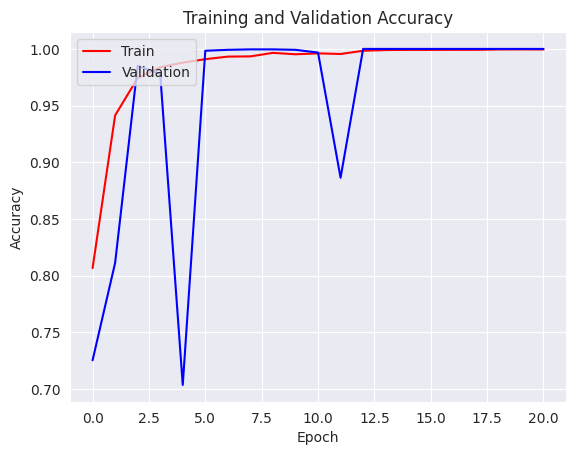

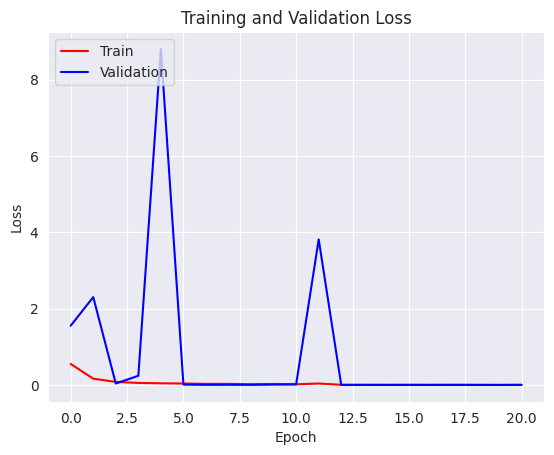

In [18]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

# Plot Accuracy
plt.plot(epochs, acc, 'r')
plt.plot(epochs, val_acc, 'b')
plt.title('Training and Validation Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.grid(True)
plt.show()

# Plot Loss
plt.plot(epochs, loss, 'r')
plt.plot(epochs, val_loss, 'b')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.title('Training and Validation Loss')
plt.grid(True)
plt.show()

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


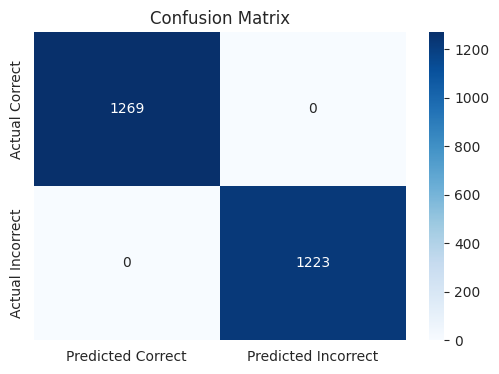


Classification Report:

              precision    recall  f1-score   support

     Correct     1.0000    1.0000    1.0000      1269
   Incorrect     1.0000    1.0000    1.0000      1223

    accuracy                         1.0000      2492
   macro avg     1.0000    1.0000    1.0000      2492
weighted avg     1.0000    1.0000    1.0000      2492



In [19]:
# Reset generator and predict
test_generator.reset()
preds_1 = model_1.predict(test_generator, verbose=0)
preds_1 = (preds_1 > 0.5).astype("int32")

# Confusion Matrix
cm = pd.DataFrame(data=confusion_matrix(test_generator.classes, preds_1, labels=[0, 1]),
                  index=["Actual Correct", "Actual Incorrect"],
                  columns=["Predicted Correct", "Predicted Incorrect"])

plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title('Confusion Matrix')
plt.show()

# Classification Report
print("\nClassification Report:\n")
print(classification_report(test_generator.classes, preds_1, target_names=['Correct', 'Incorrect'], digits=4))

## **Konversi Model**

### **SavedModel**

In [29]:
save_path = "saved_model/"
tf.saved_model.save(model_1, save_path)

### **TFJS**

In [41]:
!pip install tensorflowjs

2025-04-22 14:59:52.416808: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1745333992.445005  163460 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1745333992.452912  163460 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
🌲 Try https://ydf.readthedocs.io, the successor of TensorFlow Decision Forests with more features and faster training!
Traceback (most recent call last):
  File "/usr/local/bin/tensorflowjs_converter", line 8, in <module>
    sys.exit(pip_main())
             ^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/tensorflowjs/converters/converter.py", line 959, in pip_main
    main([' '.join(sys.argv[1:])])
  File "/usr/local/lib

In [47]:
model_1.save("model.h5")
!tensorflowjs_converter --input_format=keras model.h5 tfjs_model

2025-04-22 15:06:46.167998: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1745334406.208376  165147 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1745334406.220024  165147 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
🌲 Try https://ydf.readthedocs.io, the successor of TensorFlow Decision Forests with more features and faster training!
failed to lookup keras version from the file,
    this is likely a weight only file


### **TF-Lite**

In [40]:
tflite_dir = 'tflite'
os.makedirs(tflite_dir, exist_ok=True)

# Mengonversi model SavedModel ke TFLite
converter = tf.lite.TFLiteConverter.from_saved_model(save_path)
tflite_model = converter.convert()

# Simpan model TFLite ke dalam folder tflite
tflite_path = os.path.join(tflite_dir, "model.tflite")
with open(tflite_path, "wb") as f:
    f.write(tflite_model)

# Simpan label
labels = ["Correct", "Incorrect"]
with open(os.path.join(tflite_dir, "labels.txt"), "w") as f:
    f.write("\n".join(labels))

In [49]:
!zip -r tfjs_model.zip tfjs_model
!zip -r tflite.zip tflite
!zip -r saved_model.zip saved_model

from google.colab import files
files.download('tfjs_model.zip')
files.download('tflite.zip')
files.download('saved_model.zip')

updating: tfjs_model/ (stored 0%)
updating: tfjs_model/group1-shard2of2.bin (deflated 7%)
updating: tfjs_model/group1-shard1of2.bin (deflated 7%)
updating: tfjs_model/model.json (deflated 89%)
updating: tfjs_model/.ipynb_checkpoints/ (stored 0%)
updating: tflite/ (stored 0%)
updating: tflite/model.tflite (deflated 73%)
updating: tflite/labels.txt (deflated 18%)
updating: saved_model/ (stored 0%)
updating: saved_model/fingerprint.pb (stored 0%)
updating: saved_model/variables/ (stored 0%)
updating: saved_model/variables/variables.data-00000-of-00001 (deflated 18%)
updating: saved_model/variables/variables.index (deflated 65%)
updating: saved_model/assets/ (stored 0%)
updating: saved_model/saved_model.pb (deflated 88%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [53]:
 pip freeze requirements.txt

absl-py==1.4.0
accelerate==1.5.2
aiohappyeyeballs==2.6.1
aiohttp==3.11.15
aiosignal==1.3.2
alabaster==1.0.0
albucore==0.0.23
albumentations==2.0.5
ale-py==0.10.2
altair==5.5.0
annotated-types==0.7.0
anyio==4.9.0
argon2-cffi==23.1.0
argon2-cffi-bindings==21.2.0
array_record==0.7.1
arviz==0.21.0
astropy==7.0.1
astropy-iers-data==0.2025.4.14.0.37.22
astunparse==1.6.3
atpublic==5.1
attrs==25.3.0
audioread==3.0.1
autograd==1.7.0
babel==2.17.0
backcall==0.2.0
backports.tarfile==1.2.0
beautifulsoup4==4.13.4
betterproto==2.0.0b6
bigframes==1.42.0
bigquery-magics==0.9.0
bleach==6.2.0
blinker==1.9.0
blis==1.3.0
blosc2==3.3.0
bokeh==3.6.3
Bottleneck==1.4.2
bqplot==0.12.44
branca==0.8.1
CacheControl==0.14.2
cachetools==5.5.2
catalogue==2.0.10
certifi==2025.1.31
cffi==1.17.1
chardet==5.2.0
charset-normalizer==3.4.1
chex==0.1.89
clarabel==0.10.0
click==8.1.8
cloudpathlib==0.21.0
cloudpickle==3.1.1
cmake==3.31.6
cmdstanpy==1.2.5
colorcet==3.1.0
colorlover==0.3.0
colour==0.1.5
community==1.0.0b1
confe